# Enhanced Deep Residual Networks for Single Image Super-Resolution 

## Imports
First, let's import all the  necessary libraries. I have included [Weights & Biases (wandb)](https://wandb.ai/site) library so the training progress can be easily tracked.

In [ ]:
import glob
import matplotlib.pyplot as plt
import os
import random

import torch 
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms.functional as TVF

from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.datasets.utils import download_url, extract_archive, list_files
from tqdm.notebook import tqdm

# Set random seed so everyone get the same results
torch.manual_seed(42)
random.seed(42)

%matplotlib inline

!pip install wandb
import wandb
wandb.init(project='EDSR', mode='disabled') # delete mode='disabled' to use wandb - https://wandb.ai/site

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 39.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.7/201.7 kB 26.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.8 MB/s eta 0:00:00
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8807 sha256=7fbcd6c817a38fb177b736a7256068bd09b870b41044deb9e2a396cba6c28fe7
  Stored in directory: /root/.cache/pip/wheels/e7/f3/22/152153d6eb222ee7a56ff8617d80ee5207207a8c00a7aab794
Successfully built pathtools


## DIV2K Dataset
We will be using the [DIV2K](https://data.vision.ee.ethz.ch/cvl/DIV2K/) dataset for this project (see 4.1 Datasets). DIV2K has 1000 2k resolution images that have been down scaled by ×2, ×3, or ×4 with either [bicubic](https://en.wikipedia.org/wiki/Bicubic_interpolation) or unknown down scaling. In this example, we will only be looking at **bicubic** scaling.

### Creating a PyTorch Dataset
Let's create a PyTorch dataset using [torch.utils.data.Dataset](https://pytorch.org/docs/stable/data.html#torch.utils.data.Dataset) class. This class will automaticity download and extract all the files we require. All images will be randomly cropped to 48×48 pixels for the low-resolution source image and the high-resolution target will be scaled to the appropriate size, e.g. x4 scale is 192×192.

### Data augmentation
DIV2K dataset is relatively small with only 800 training samples, this can lead to overfitting. In machine learning, we can apply transformations to our data to increase the number of unique training examples in our dataset, this is known as data augmentation. 

We will be using the same data augmentation as the authors, horizontal flip and rotation (see 4.2 Training Details). To apply these transformations we will be using [transforms](https://pytorch.org/vision/stable/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py) provided by the torchvision library. 

In [ ]:
class DIV2K(Dataset):
    def __init__(self, root='./data', split='train', scale=4,  src_size=48):
        assert split in ['train', 'valid']
        assert scale in [2, 3, 4]

        self.split = split
        self.scale = scale
        self.src_size = src_size

        # Download urls
        self.urls = {'train': {'tgt': 'http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip', 
                               'src': f'http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X{scale}.zip'},
                    'valid': {'tgt': 'http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip', 
                              'src': f'http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_LR_bicubic_X{scale}.zip'}}

        self.files = self.download_dataset(root, split, scale)

        
    ## Download and extract missing data
    def download_dataset(self, root, split, scale):
        files = {}
        root = './data'
        for sample in ['src', 'tgt']:
            url = self.urls[split][sample]
            filename = url.split('/')[-1]
            if not os.path.exists(os.path.join(root, filename)):
                dataset_zip = download_url(url, root=root)

            if sample == 'tgt':
                image_dir = os.path.join(root, filename.split('.')[0])  
            else:
                image_dir = os.path.join(root, f'DIV2K_{self.split}_LR_bicubic', 'X'+str(scale))

            if not os.path.exists(image_dir):
                extract_archive(os.path.join(root, filename))

            files[sample] = sorted(glob.glob(os.path.join(image_dir, '*.png')))

        assert len(files['src']) == len(files['tgt']), '{} != {}'.format(len(files['src']), len(files['tgt']))
        return files

    
    ## Crop & resize the image to the apporiate scales
    def resize(self, src, tgt, scale, src_size, center=False):
        tgt_size = src_size * scale
    
        if center:
            src_left = src.size[0]//2 - src_size
            src_top = src.size[1]//2 - src_size
        else:
            src_left = random.choice(range(src.size[0] - src_size))
            src_top = random.choice(range(src.size[1] - src_size))

        tgt_left = src_left * scale
        tgt_top = src_top * scale

        src = TVF.crop(src, src_top, src_left, src_size, src_size)
        tgt = TVF.crop(tgt, tgt_top, tgt_left, tgt_size, tgt_size)

        return src, tgt

    
    ## Data augmentation - horizonal flip, vertical flip, rotate
    def apply_transforms(self, src, tgt):
    
        ## Radomly flip the images in the horizontal axis
        if random.random() > 0.5:
            src = TVF.hflip(src)
            tgt = TVF.hflip(tgt)
        
        ## Randomly rotate the images
        rotate_angle = random.choice([0, 90, 180, 270])
        src = TVF.rotate(src, angle=rotate_angle)
        tgt = TVF.rotate(tgt, angle=rotate_angle)

        return src, tgt

    
    ## Returns the number of samples in our dataset (Required for torch DataLoader)   
    def __len__(self):
        return len(self.files['src'])

    
    ## Get a sample from out dataset (Required for torch DataLoader)
    def __getitem__(self, idx):
        src = Image.open(self.files['src'][idx])
        tgt = Image.open(self.files['tgt'][idx])

        if self.split == 'train':
            src, tgt = self.resize(src, tgt, self.scale, self.src_size)
            src, tgt = self.apply_transforms(src, tgt)
        elif self.src_size is not None:
            src, tgt = self.resize(src, tgt, self.scale, self.src_size, center=True)   

        return TVF.to_tensor(src), TVF.to_tensor(tgt)

## Helper Function - show_image

Next, let's create a small function to display up to three images next to each other so that we can easily visualize the data.

In [ ]:
def show_image(src, tgt, pred=None, labels=['Source', 'Traget', 'Prediction'], dpi=100):
    n_imgs = 2 if pred is None else 3

    plt.figure(figsize=(8*n_imgs, 10), dpi=dpi)

    img = src[0].permute(1, 2, 0)
    ax = plt.subplot(1, n_imgs, 1)
    plt.imshow(img.clip(0, 1))
    plt.title(f'{labels[0]} - {list(img.shape)}')
    plt.axis("off")

    img = tgt[0].permute(1, 2, 0)
    ax = plt.subplot(1, n_imgs, 2)
    plt.imshow(img.clip(0, 1))
    plt.title(f'{labels[1]} - {list(img.shape)}')
    plt.axis("off")

    if pred is not None:
        img = pred[0].permute(1, 2, 0)
        ax = plt.subplot(1, n_imgs, 3)
        plt.imshow(img.clip(0, 1))
        plt.title(f'{labels[2]} - {list(img.shape)}')
        plt.axis("off")

    plt.show()

## Testing and Downloading DIV2k Dataset
Now that we have the Dataset and show_image function, let's test the functionality of our Dataset and test it is working correctly. Firstly, let's define our image scale. As this is the first run, let's set our scale to 2. Next we need to create our dataset object by calling the dataset class we created, let's load the validation split first as it is small, and it will load quicker. We then need to create a data loader using our dataset so that we can easily load data in training and evaluation.

In [ ]:
SCALE = 2

val_data = DIV2K(split='valid', scale=SCALE)
val_loader = DataLoader(val_data, batch_size=1, shuffle=False)

train_data = DIV2K(split='train', scale=SCALE)
train_loader = DataLoader(val_data, batch_size=1, shuffle=False)

100%|██████████| 117763600/117763600 [00:08<00:00, 13248510.26it/s]


100%|██████████| 448993893/448993893 [00:31<00:00, 14312898.68it/s]


100%|██████████| 925390592/925390592 [01:04<00:00, 14372506.52it/s]


100%|██████████| 3530603713/3530603713 [03:50<00:00, 15314534.31it/s]


Finally, let's test everything by loading the first **three** samples from the dataloader and displaying them below.

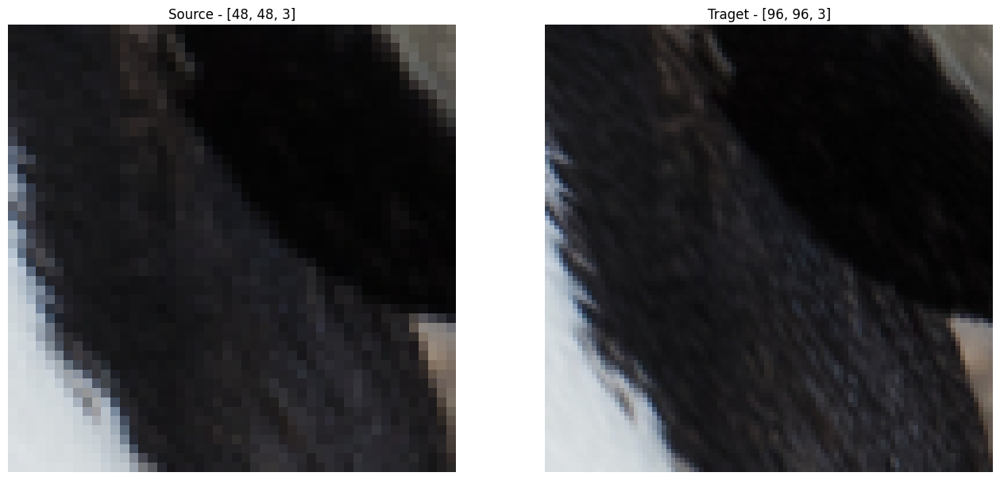

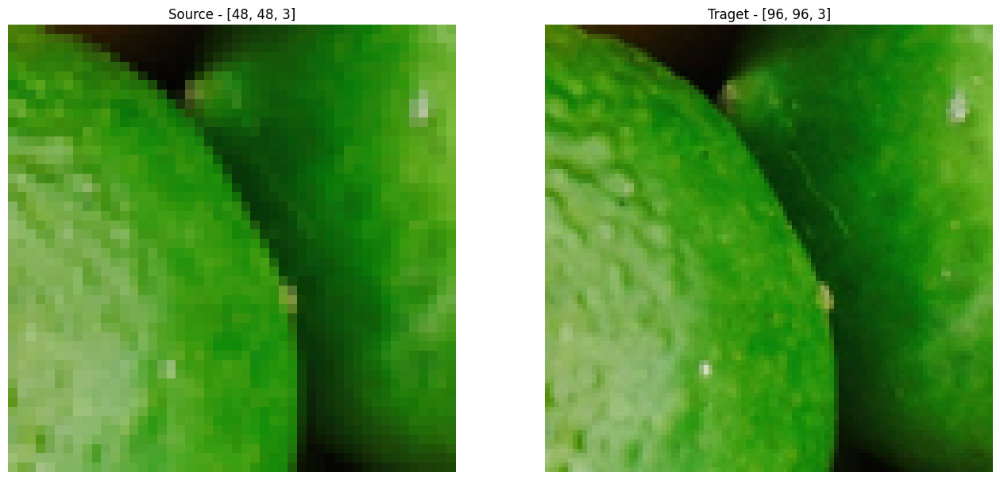

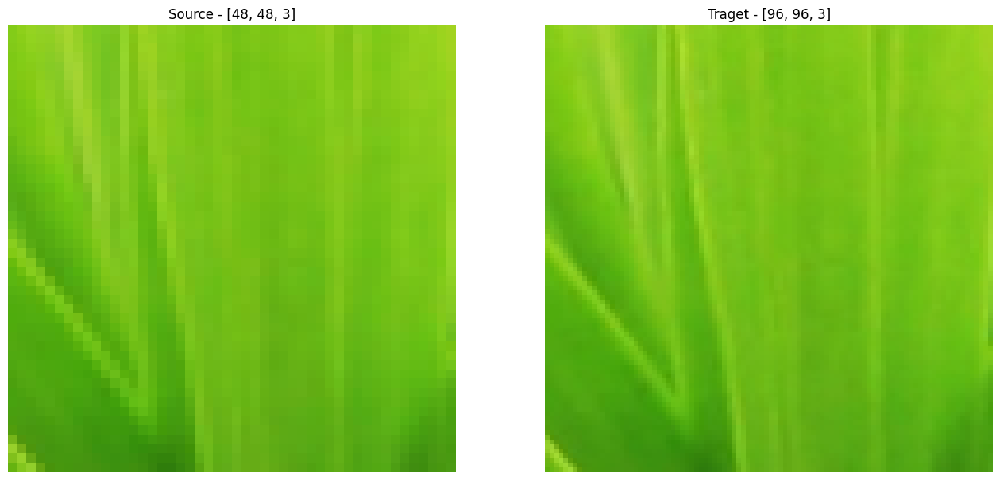

In [ ]:
for i, (src, tgt) in enumerate(val_loader):
    show_image(src, tgt)
    if i >= 2:
        break

## Creating EDSR ResBlock and Model

EDSR is inspired by SRResNet and uses a [ResNet](https://en.wikipedia.org/wiki/Residual_neural_network) like block to create the model's backbone. The major change between SRResNet is the removal of the batch normalization layers. The removal of the batch normalization layers allows greater range of information and reduces memory consumption at training. The authors quote a 40% reduction in memory over SRResNet (see 3.1 Residual Blocks).

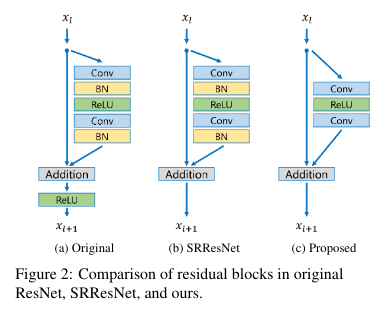

In [ ]:
class EDSRResBlock(nn.Module):
    def __init__(self, filters=64, kernel_size=3, padding='same', res_scaling=1):
        super(EDSRResBlock, self).__init__()

        self.res_scaling = res_scaling

        self.conv1 = nn.Conv2d(filters, filters, kernel_size, padding=kernel_size//2)
        self.relu = nn.ReLU()
        self.conv2 = nn.Conv2d(filters, filters, kernel_size, padding=kernel_size//2)

    def forward(self, x):
        out = self.conv1(x)   # Conv
        out = self.relu(out)  # ReLU
        out = self.conv2(out) # Conv
        out = out * self.res_scaling
        out = out + x         # Addition/Skip connection

        return out

## Upsample block
The EDSR upsample block uses a convolutional layer and a PixelShuffle layer. PixelShuffle is a common operation in super-resolution models that trades channels for higher resolutions. Such that $(C \times t^2, H, W) \rightarrow (C, H\times t, W\times t)$, where $t$ is scaling factor. One Upsample block uses a scaling factor of X2, so if we want to upscale by X4, we should use two Upsample blocks.

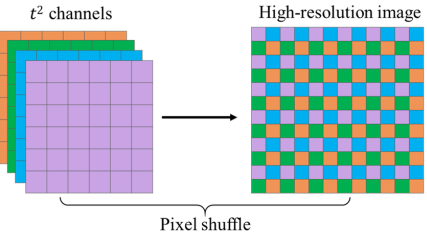

In [ ]:
class Upsample(nn.Module):
    def __init__(self, filters=64, kernel_size=3, padding='same'):
        super(Upsample, self).__init__()
        
        scaling_factor = 2
        self.conv = nn.Conv2d(filters, filters*scaling_factor**2, kernel_size, padding=kernel_size//2)
        self.pixel_shuffle = nn.PixelShuffle(scaling_factor)

    def forward(self, x):
        out = self.conv(x) # Channels: 64 -> 256
        out = self.pixel_shuffle(out) # Channels: 256 -> 64

        return out

## Normalizing data
Each input must be normalized by subtracting the mean RGB values of the DIV2K train dataset (4.2 Training Details).

In [ ]:
class MeanShift(nn.Module):
    def __init__(self, rgb_range=1, rgb_mean=(0.4488, 0.4371, 0.4040), sign=-1):
        super(MeanShift, self).__init__()
        
        rgb_mean = sign * rgb_range * torch.Tensor(rgb_mean)
        self.register_buffer('rgb_mean', rgb_mean.view(1,3,1,1))
        
    def forward(self, x):
        return x + self.rgb_mean

## Defining EDSR

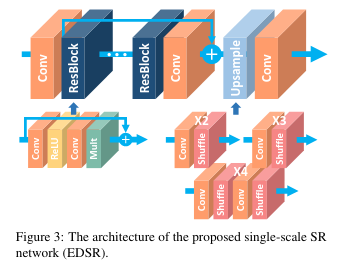

In [ ]:
class EDSR(nn.Module):
    def __init__(self, n_resblock=16, filters=64, res_scaling=1, scale=4):
        super(EDSR, self).__init__()
        
        self.scale = scale
        
        # Define convolutional layers
        self.conv_in = nn.Conv2d(3, filters, kernel_size=3, padding=3//2)
        self.conv_mid = nn.Conv2d(filters, filters, kernel_size=3, padding=3//2)
        self.conv_out = nn.Conv2d(filters, 3, kernel_size=3, padding=3//2)
        
        # Define ResBlock layers
        res_blocks = [EDSRResBlock(filters=filters, res_scaling=res_scaling) for _ in range(n_resblock)]
        self.res_blocks = nn.Sequential(*res_blocks)
        
        # Define Upscale layers
        self.upsample_x2 = Upsample(filters=filters)
        if scale == 4:
            self.upsample_x4 = Upsample(filters=filters)
            
        # Define normalization layers
        self.mean_sub = MeanShift(sign=-1)
        self.mean_add = MeanShift(sign=1)
    
    
    def forward(self, x):
        x = self.mean_sub(x) # Subtract DIV2k mean
        x = self.conv_in(x) # Channels: 3 -> 64

        out = self.res_blocks(x)
        out = self.conv_mid(out)
        out = out + x # Addition/Skip connection

        out = self.upsample_x2(out) # Upsample to X2
        if self.scale == 4:
            out = self.upsample_x4(out) # Upsample to X4
            
        out = self.conv_out(out) # Channels: 64 -> 3
        out = self.mean_add(out) # Add DIV2k mean

        return out

## Build the model
Let's build the model using the hyperparameters from the original paper, 32 residual blocks, 256 filter, and 0.1 residual scaling. We can check our model is correct by checking that the number of parameters is the same, 40,000,000 for x2 and 43,000,000 for x4.

If we are scaling larger than x2, we should load the pre-trained x2 model weights to reduce the training time and improved accuracy over training from scratch (4.2 Training Details). 

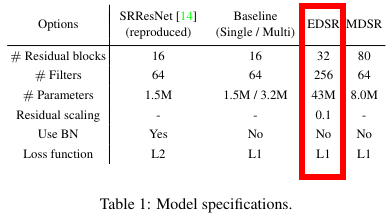

In [ ]:
SCALE = 2 #put by me
model = EDSR(filters=256, n_resblock=32, res_scaling=0.1, scale=SCALE)
print('Number of parameters: ', sum(param.numel() for param in model.parameters() if param.requires_grad))

if SCALE > 2:
    model.load_state_dict(torch.load('./data/EDSR_X2.pt'), strict=False)

Number of parameters:  40729603


## Testing the model
Now that we have built the model, let's test it by passing a single input through it. First, let's move our model to the GPU for quicker inference and training. We can see from the outputs gray with a vague outline of the input, this is expected as the model's weight have not been trained yet.

Using cuda:0


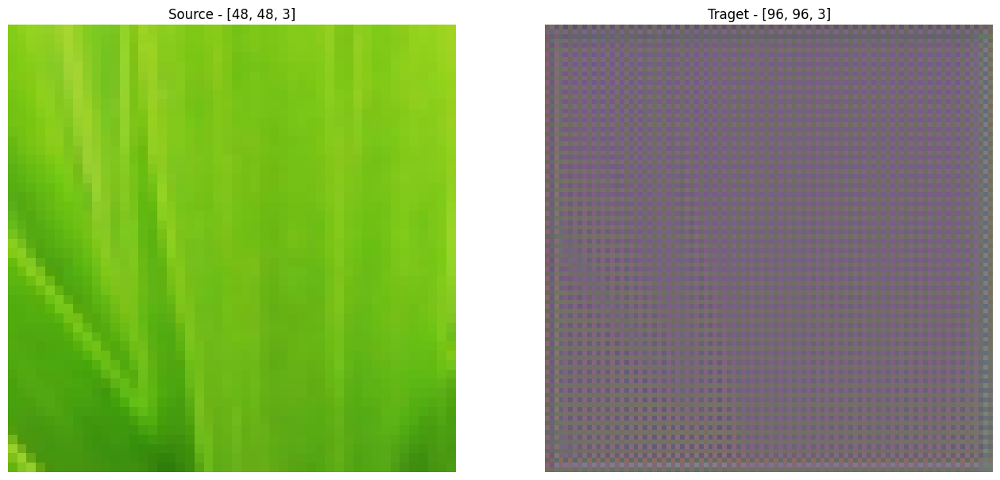

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') # Select GPU is available
print(f'Using {device}')

model.to(device) # Move model to device
test_src = src.to(device) # Move source to device
test_tgt = tgt.to(device) # Move target to device

with torch.no_grad():
    out = model(test_src) # Pass the source image to the model
show_image(src.cpu(), out.cpu().detach())

## Evaluation Metrics


### Peak Signal-to-Noise Ratio (PSNR)
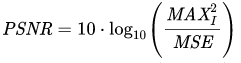
Where MSE is the mean-squared error between the two images and MAX is the maximum value in the data, in this case it is 1 as all images are represented between 0 and 1. **PSNR is a logarithmic scale.** [Compare decibel values](https://rechneronline.de/log-scale/decibel.php).

In [ ]:
def psnr(img1, img2):
    mse = torch.mean( (img1 - img2) ** 2 )
    return 10 * torch.log10( 1 / mse ).item()

### Structural Similarity Index (SSIM)

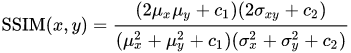

In [ ]:
def _fspecial_gauss_1d(size, sigma):
    coords = torch.arange(size, dtype=torch.float)
    coords -= size // 2

    g = torch.exp(-(coords ** 2) / (2 * sigma ** 2))
    g /= g.sum()

    return g.unsqueeze(0).unsqueeze(0)

def gaussian_filter(input, win):
    C = input.shape[1]
    out = input
    for i, s in enumerate(input.shape[2:]):
        out = F.conv2d(out, weight=win.transpose(2 + i, -1), stride=1, padding=0, groups=C)

    return out

def _ssim(X, Y, data_range, win, K):

    K1, K2 = K
    compensation = 1.0

    C1 = (K1 * data_range) ** 2
    C2 = (K2 * data_range) ** 2

    win = win.to(X.device, dtype=X.dtype)

    mu1 = gaussian_filter(X, win)
    mu2 = gaussian_filter(Y, win)

    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1 * mu2

    sigma1_sq = compensation * (gaussian_filter(X * X, win) - mu1_sq)
    sigma2_sq = compensation * (gaussian_filter(Y * Y, win) - mu2_sq)
    sigma12 = compensation * (gaussian_filter(X * Y, win) - mu1_mu2)

    cs_map = (2 * sigma12 + C2) / (sigma1_sq + sigma2_sq + C2)
    ssim_map = ((2 * mu1_mu2 + C1) / (mu1_sq + mu2_sq + C1)) * cs_map

    ssim_per_channel = torch.flatten(ssim_map, 2).mean(-1)
    cs = torch.flatten(cs_map, 2).mean(-1)
    return ssim_per_channel, cs

def ssim(X, Y, data_range=1.0, window_size=11, window_sigma=1.5, K=(0.01, 0.03)):
    window = _fspecial_gauss_1d(window_size, window_sigma)
    window = window.repeat([X.shape[1]] + [1] * (len(X.shape) - 1))

    ssim_per_channel, cs = _ssim(X, Y, data_range=data_range, win=window, K=K)

    return ssim_per_channel.mean().item()

## Training Code
Here is our training code. We simply loop over the dataset and update the model weights at each batch. We also record and return the average loss and PSNR to track the training progress.

In [ ]:
loss_history = []
def train(model, dataloader, criterion, optimizer, epoch, device):
    if not model.training:
        model.train()

    losses = torch.zeros(len(dataloader))
    psnrs = torch.zeros(len(dataloader))

    for idx, (src, tgt) in enumerate(tqdm(dataloader, desc=f'Epoch {epoch}', leave=False)):
        optimizer.zero_grad()

        src = src.to(device)
        tgt = tgt.to(device)

        pred = model(src)
        loss = criterion(pred, tgt)

        loss.backward()
        optimizer.step()

        losses[idx] = loss.item()
        psnrs[idx] = psnr(tgt, pred)
        
        global_step = (epoch-1)*len(dataloader) + idx
        wandb.log({'Train/Loss': losses[idx], 'Train/PSNR': psnrs[idx]}, step=global_step)

    loss_history.append(losses.mean().item())
    return losses.mean().item(), psnrs.mean().item()

## Evaluation Code
Here is the code to evaluate the model, it is pretty similar to the training code. The major difference is that we must use `with torch.no_grad():` to ensure no gradients are calculated from the evaluation input.

In [ ]:
def evaluate(model, dataloader, criterion, device):
    model.eval()

    losses = torch.zeros(len(dataloader))
    psnrs = torch.zeros(len(dataloader))

    with torch.no_grad():
        for idx, (src, tgt) in enumerate(tqdm(dataloader, desc='Eval', leave=False)):
            src = src.to(device)
            tgt = tgt.to(device)

            pred = model(src)
            losses[idx] = criterion(pred, tgt)
            psnrs[idx] = psnr(tgt, pred)

    return losses.mean().item(), psnrs.mean().item()

## Start Training
Now we have all our functions ready, we can begin training.

Using the information in 4.2 Training details, we can set up the training.
We train using [L1Loss](https://pytorch.org/docs/stable/generated/torch.nn.L1Loss.html) (mean absolute error) with [Adam optimizer](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/). Batch size is set to 16, training data is shuffled, and we can use 2 workers to speed up the DataLoader.

Epoch 1:   0%|          | 0/50 [00:00<?, ?it/s]

Eval:   0%|          | 0/100 [00:00<?, ?it/s]

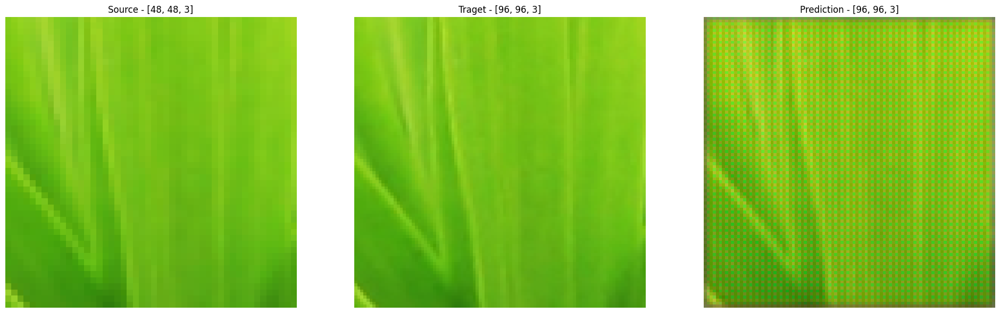

Epoch: 1, Loss: 0.1405, PSNR: 17.38, Val Loss: 0.0413, Val PSNR: 25.66


Epoch 2:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 3:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 4:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5:   0%|          | 0/50 [00:00<?, ?it/s]

Eval:   0%|          | 0/100 [00:00<?, ?it/s]

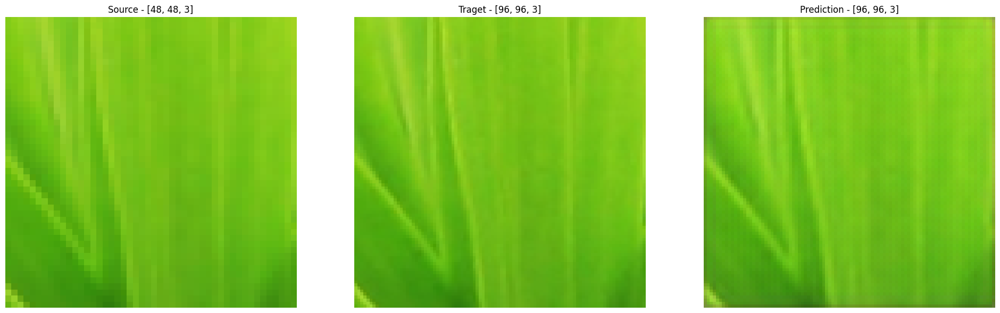

Epoch: 5, Loss: 0.0238, PSNR: 28.88, Val Loss: 0.0275, Val PSNR: 29.06


Epoch 6:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 7:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 8:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 9:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 10:   0%|          | 0/50 [00:00<?, ?it/s]

Eval:   0%|          | 0/100 [00:00<?, ?it/s]

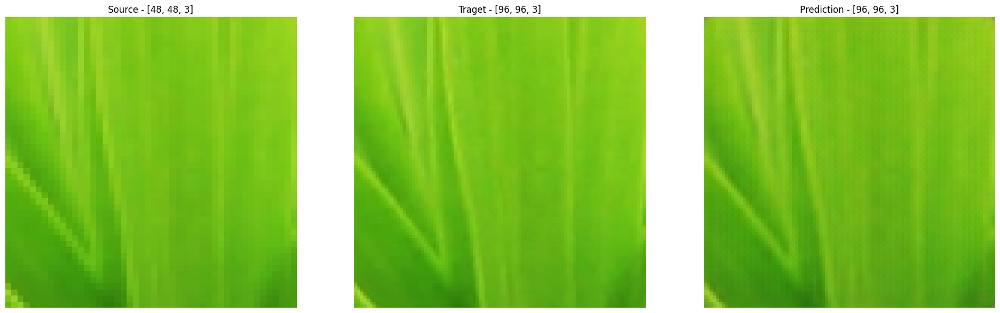

Epoch: 10, Loss: 0.0216, PSNR: 29.47, Val Loss: 0.0229, Val PSNR: 30.61


Epoch 11:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 12:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 13:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 14:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 15:   0%|          | 0/50 [00:00<?, ?it/s]

Eval:   0%|          | 0/100 [00:00<?, ?it/s]

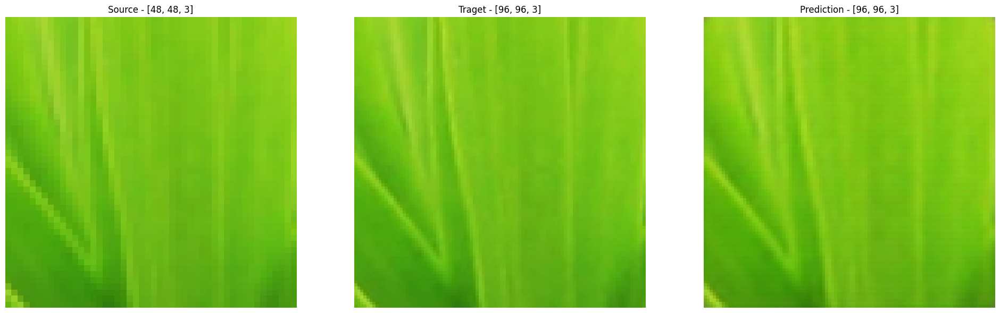

Epoch: 15, Loss: 0.0201, PSNR: 29.73, Val Loss: 0.0209, Val PSNR: 31.13


Epoch 16:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 17:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 18:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 19:   0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
if not os.path.exists('./ckpt'):
    os.mkdir('./ckpt')
    
# Set up loss function and optimizer
criterion = nn.L1Loss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-8)

# Set up learning rate scheduler - decrease lr by half if valiadation loss does not improve after 10 steps
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=10, factor=0.5)

# Set up training data
train_data = DIV2K(split='train', scale=SCALE)
train_loader = DataLoader(train_data, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)

# Set up test data
val_data = DIV2K(split='valid', scale=SCALE, src_size=250)
val_loader = DataLoader(val_data, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

best_val_loss = float('inf')
# for epoch in range(1, 3002):
for epoch in range(1, 20):
    loss, psnr_ = train(model, train_loader, criterion, optimizer, epoch, device)
    
    # Calculate the validation loss every 5 epochs to reduce training time
    if epoch == 1 or epoch % 5 == 0:
        val_loss, val_psnr = evaluate(model, val_loader, criterion, device)
        scheduler.step(val_loss)
        
        # Save model checkpoint if this model is the best model
        if val_loss < best_val_loss:
            torch.save(model.state_dict(), f'./ckpt/EDSR_X{SCALE}.pt')
        best_val_loss = val_loss
        
        # Show a example output
        pred = model(test_src)      
        show_image(test_src.cpu(), test_tgt.cpu(), pred.cpu().detach())
        
        # Collect learning rate for wandb
        for param_group in optimizer.param_groups:
            lr = param_group['lr']
        global_step = (epoch)*len(train_loader)
        
        print('Epoch: {}, Loss: {:.4f}, PSNR: {:.2f}, Val Loss: {:.4f}, Val PSNR: {:.2f}'.format(epoch, loss, psnr_, val_loss, val_psnr))        
        wandb.log({'Val/Loss': val_loss, 'Val/PSNR': val_psnr,'Train/Learning Rate': lr}, step=global_step)

In [ ]:
  print("Best Val_Loss", best_val_loss)
print("Loss array")
print(loss)
print("valiadation loss")
print(val_loss)
print(loss_history)

Best Val_Loss 0.020904915407299995
Loss array
0.019981378689408302
valiadation loss
0.020904915407299995
[0.14051753282546997, 0.030137620866298676, 0.02559356763958931, 0.024861888960003853, 0.02375349961221218, 0.022166866809129715, 0.026681382209062576, 0.02300981990993023, 0.023755619302392006, 0.02164713852107525, 0.02008514478802681, 0.018939238041639328, 0.02097129635512829, 0.024760384112596512, 0.020064497366547585, 0.01872030459344387, 0.019514473155140877, 0.018345283344388008, 0.019981378689408302]


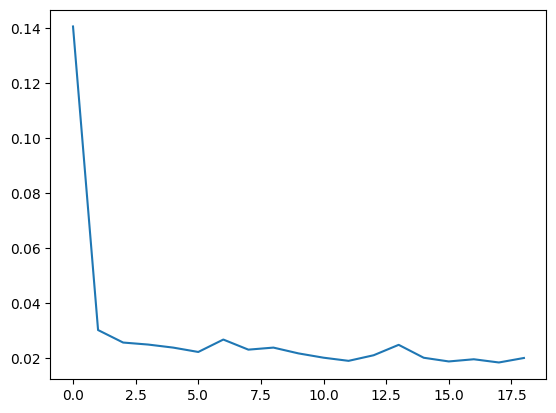

In [ ]:
plt.plot(loss_history)


## Download Pre-Trained Models


In [ ]:
download_url('https://github.com/mbodenham/edsr-notebook/raw/main/ckpt/EDSR_X2.pt', root='./ckpt_trained')
download_url('https://github.com/mbodenham/edsr-notebook/raw/main/ckpt/EDSR_X4.pt', root='./ckpt_trained')

100%|██████████| 162967277/162967277 [00:00<00:00, 357870237.99it/s]


100%|██████████| 172409321/172409321 [00:00<00:00, 343057837.55it/s]


## Visualizing the results
Here we can test our model and see how effective the upscaling is compared to bicubic scaling. Visually we can see that EDSR images are sharper than bicubic, EDSR also outperforms bicubic in the evaluation metrics.

Feel free to play with `SRC_SIZE` to get scaling results from different resolutions.

You can right-click an image and open it in a new tab to take a closer look at the results.

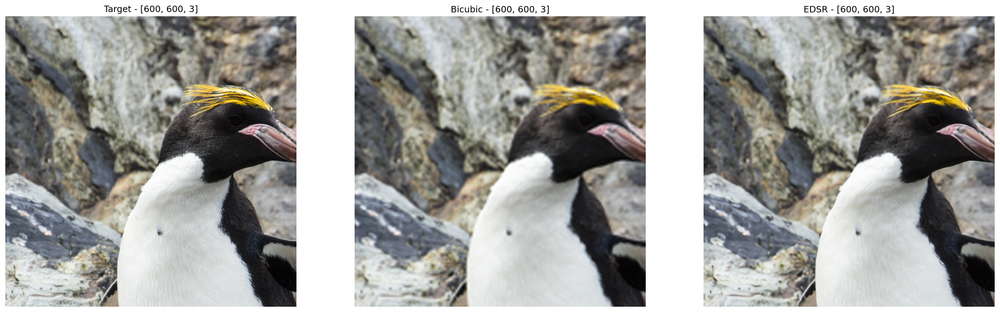

PSNR - Bicubic: 30.40, EDSR: 33.17
SSIM - Bicubic: 0.889, EDSR: 0.926



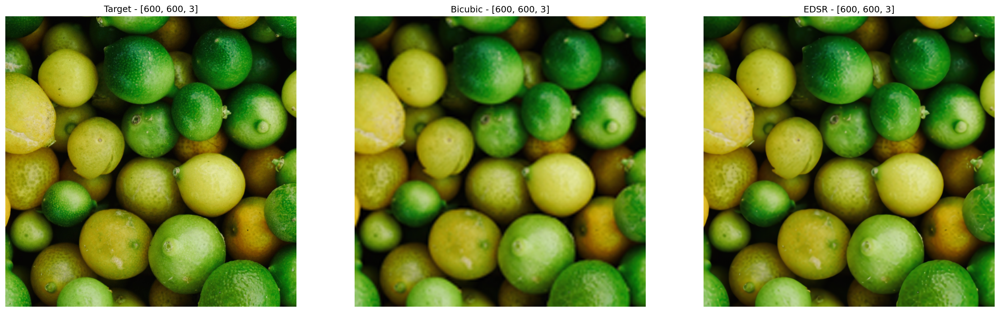

PSNR - Bicubic: 32.68, EDSR: 34.58
SSIM - Bicubic: 0.863, EDSR: 0.893



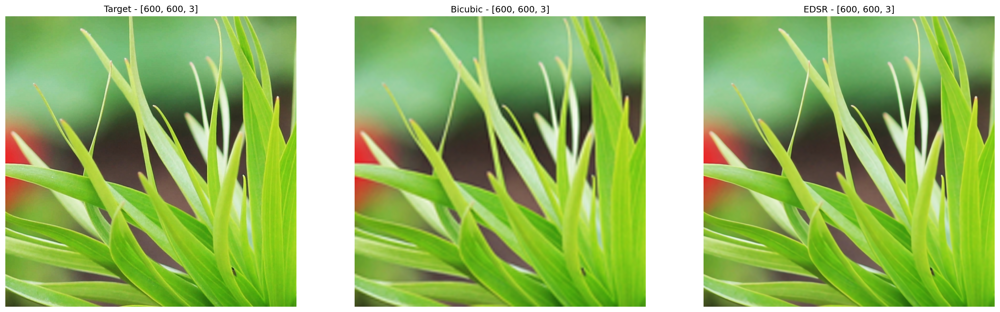

PSNR - Bicubic: 30.23, EDSR: 38.23
SSIM - Bicubic: 0.888, EDSR: 0.962



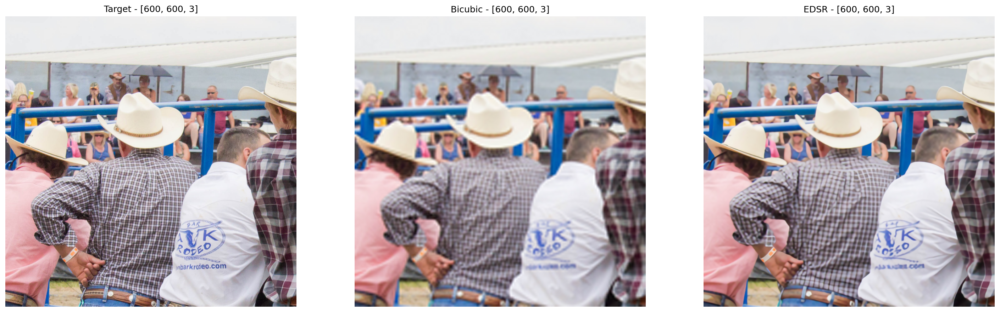

PSNR - Bicubic: 24.11, EDSR: 25.69
SSIM - Bicubic: 0.742, EDSR: 0.834



In [ ]:
SCALE = 4
# SCALE = 2
SRC_SIZE = 150
DPI = 150

val_data = DIV2K(split='valid', scale=SCALE, src_size=SRC_SIZE)
val_loader = DataLoader(val_data, batch_size=1, shuffle=False, num_workers=2)

model = EDSR(filters=256, n_resblock=32, res_scaling=0.1, scale=SCALE).to(device)
model.load_state_dict(torch.load(f'./ckpt_trained/EDSR_X{SCALE}.pt'), strict=True)
model.eval()
psnr_bicubic = []
psnr_edsr = []
with torch.no_grad():
    for idx, (src, tgt) in enumerate(val_loader):
        test_src = src.to(device)
        test_tgt = tgt.to(device)

        pred = model(test_src)
        bicubic = TVF.resize(src, SRC_SIZE*SCALE, torchvision.transforms.functional.InterpolationMode.BICUBIC)

        show_image(tgt, bicubic, pred.cpu().detach(), labels=['Target', 'Bicubic', 'EDSR'], dpi=DPI)
        print('PSNR - Bicubic: {:.2f}, EDSR: {:.2f}'.format(psnr(tgt, bicubic), psnr(tgt, pred.cpu().detach())))
        psnr_bicubic.append(psnr(tgt, bicubic))
        psnr_edsr.append(psnr(tgt, pred.cpu().detach()))
        print('SSIM - Bicubic: {:.3f}, EDSR: {:.3f}\n'.format(ssim(tgt, bicubic), ssim(tgt, pred.cpu().detach())))
        if idx > 10:
            break

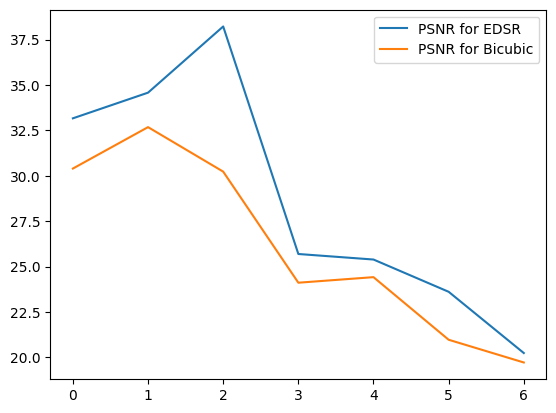

In [27]:
plt.plot(psnr_edsr)
plt.plot(psnr_bicubic)
plt.legend(["PSNR for EDSR", "PSNR for Bicubic"]);